## Preprocessing

In [ ]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error
from sklearn.metrics import r2_score
import json
import time
import random

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

Let's define the hyperparameters and complete the necessary preprocessing steps.

In [ ]:
TRAIN_BATCH_SIZE = 512
TEST_BATCH_SIZE = 1
TIME_WINDOW_SIZE = 12
EPOCHS = 200

NUMBER_OF_CLIENTS = 50 # Controls the number of households used for forecasting.

In [ ]:
def prepare_weather():
  weather = pd.read_csv('weather.csv', parse_dates=[3])
  weather = weather[weather['time'].dt.strftime('%Y') == '2013'].sort_values(by=['time'])
  weather = weather.set_index('time')
  weather = weather[['temperature', 'humidity']]
  return weather

def load_data():
    df = pd.read_csv('combined.csv', parse_dates=[1])
    return df
    
def read_uv_data():
  uv = pd.read_csv('weather_daily_darksky.csv', usecols = ['uvIndex', 'time'], parse_dates=[1])
  uv = uv[uv['time'].dt.strftime('%Y') == '2013'].sort_values(by=['time'])
  uv = uv.set_index('time')
  uv = uv.resample(rule='H').ffill()
  uv = uv[:4380]
  return uv

def basic_preprocess_fn(df:pd.DataFrame):
    """ Selects the electricity data with standard tariffs belonging to year 2013 and sorts the dataframe based on 
    DateTime column. """
    
    temp = df[df['DateTime'].dt.strftime('%Y') == '2013'].sort_values(by=['DateTime'])
    #temp = temp[temp['stdorToU'] == 'Std']
    #temp = temp.drop(axis=1, columns = 'stdorToU')
    return temp

def extract_clients(df:pd.DataFrame):
    """ Extracts client ids and client data from the given dataframe, which is assumed to hold multiple 
    client information."""
    
    client_keys = df['LCLid'].value_counts().keys().tolist()
    client_list = []

    for key in client_keys:
        client_df = df[df['LCLid'] == key]
        client_list.append(client_df)

    return client_keys, client_list

def resample_fn(df:pd.DataFrame):
    """ Resamples the time-series dataframe so that it reflects hourly electricity consumption values. It also does
    basic data processing such as dropping unnecessary columns. """
    
    resample_df = df.astype({"KWH/hh (per half hour) ": float}).drop(columns = ['LCLid']).set_index('DateTime').resample(rule='H').sum()
    resample_df.rename(columns = {'KWH/hh (per half hour) ':'kWh'}, inplace = True)
    return resample_df

def remove_bad_clients(client_keys:list, client_list:list):
    """ Drops the clients with datapoints fewer than 0.9 percent of the client with highest amount of data. """
    
    sizes = [len(e) for e in client_list]
    biggest_client = max(sizes) 
    ratios = [size/biggest_client for size in sizes]
    indices_to_keep = [idx for idx,e in enumerate(ratios) if e==1]
    
    client_keys_selected = [client_keys[index] for index in indices_to_keep]
    client_list_selected = [client_list[index] for index in indices_to_keep]
    
    return client_keys_selected, client_list_selected

def create_client_dict(client_keys, client_data_list):
    """ Matches every client ID with its own electricty consumption data and returns the pairs in a python dictionary. """
    client_dict = {}
    for key, df in zip(client_keys, client_data_list):
        client_dict[key] = df
        
    return client_dict

In [ ]:
def remove_anomalies(df_list):
  """Function that removes kwh values that are smaller than 0.5 and bigger than 2.5. 
  Written to see if removing these somewhat abnormal values would increase the forecasting performance. """
  df_list_new = []
  for df in df_list:
    new_df = df[ (df['kWh'] >= 0.5) & (df['kWh'] <= 2.5) ]
    df_list_new.append(new_df)
  return df_list_new

In [ ]:
df = load_data()
temp = basic_preprocess_fn(df)
client_keys, client_list = extract_clients(temp)
client_list_resampled = list(map(resample_fn, client_list))
client_keys_selected, client_list_selected = remove_bad_clients(client_keys, client_list_resampled)

#client_list_selected_new = remove_anomalies(client_list_selected)
#client_list_selected_new = [e for e in client_list_selected_new if len(e)>=5000]

client_dict = create_client_dict(client_keys_selected, client_list_selected)
weather = prepare_weather()
uv = read_uv_data()

We can now sample some households(clients) from all the available ones.

In [ ]:
random.seed(10)
shortlist_keys = random.sample(list(client_dict.keys()), NUMBER_OF_CLIENTS)
#print(shortlist_keys)

['MAC001845', 'MAC002197', 'MAC002165', 'MAC002170', 'MAC001356', 'MAC002189', 'MAC001362', 'MAC001818', 'MAC001280', 'MAC001841', 'MAC001295', 'MAC001272', 'MAC001294', 'MAC001821', 'MAC001817', 'MAC001266', 'MAC001353', 'MAC001361', 'MAC004473', 'MAC001377', 'MAC001829', 'MAC001815', 'MAC001842', 'MAC004478', 'MAC001268', 'MAC001813', 'MAC002178', 'MAC001365', 'MAC002179', 'MAC001368', 'MAC004460', 'MAC001812', 'MAC002196', 'MAC004483', 'MAC004482', 'MAC002194', 'MAC001811', 'MAC002181', 'MAC001837', 'MAC004475', 'MAC004459', 'MAC001289', 'MAC001302', 'MAC001822', 'MAC002184', 'MAC001852', 'MAC002191', 'MAC001263', 'MAC001843', 'MAC001276']


In [ ]:
df_list = []
key_list = []
for k, v in client_dict.items():
  if k in shortlist_keys:
    #print('Added the dataset of household:', k)
    key_list.append(k)
    df_list.append(v[:4380])

Added the dataset of household: MAC001302
Added the dataset of household: MAC002170
Added the dataset of household: MAC001266
Added the dataset of household: MAC001845
Added the dataset of household: MAC004473
Added the dataset of household: MAC001294
Added the dataset of household: MAC002179
Added the dataset of household: MAC001852
Added the dataset of household: MAC001811
Added the dataset of household: MAC002178
Added the dataset of household: MAC004478
Added the dataset of household: MAC004460
Added the dataset of household: MAC001280
Added the dataset of household: MAC001829
Added the dataset of household: MAC002196
Added the dataset of household: MAC001815
Added the dataset of household: MAC001356
Added the dataset of household: MAC001353
Added the dataset of household: MAC002181
Added the dataset of household: MAC001365
Added the dataset of household: MAC001821
Added the dataset of household: MAC001263
Added the dataset of household: MAC001818
Added the dataset of household: MA

In [ ]:
# A simple check
#(df_list[0] == client_dict['MAC001302'][:4380])

## Adding Weather and Time Features

This sections is about the simple feature engineering methods I tried while writing the thesis. Unfortunately none of those helped to increase the forecasting results much, so I ignored using the functions below for this demo. Feel free to play with those if you want to observe the effects of adding potentially helpful features.

In [ ]:
def create_lags(df, col_name, num_lags):
  """ Adds lag features from the given column."""
  for lag in range(1, num_lags):
    df[col_name + '_lag_' + str(lag)] = df[col_name].shift(lag)
    
  return df

def add_date_features(df):
  """ Creates features based on the datetime index of the measurement data. """
  #df['hour'] = df.index.hour
  #df['day_of_week'] = df.index.dayofweek
  #df['week_of_year'] = df.index.isocalendar().week
  df['month'] = df.index.month
  df['is_winter'] = df['month'].isin([1, 2]).astype(int)
  df['is_spring'] = df['month'].isin([3, 4, 5]).astype(int)
  df['is_summer'] = df['month'].isin([6, 7]).astype(int)

  return df

In [ ]:
"""pd.options.mode.chained_assignment = None
enriched_data = []

for e in df_list:
  temp = e.copy()
  temp = create_lags(temp, 'kWh', 12)
  temp = pd.concat([temp, weather], join='inner', axis = 1)
  #temp = create_lags(temp, 'temperature', TIME_WINDOW_SIZE)
  #temp = create_lags(temp, 'humidity', TIME_WINDOW_SIZE)
  temp = add_date_features(temp)
  temp = temp.drop('month', axis=1)
  #temp = pd.concat([temp, uv], join='inner', axis = 1)
  temp['target'] = temp['kWh'].shift(-1)
  temp = temp.iloc[11:temp.shape[0]-1]
  temp = temp.fillna(value = 0)
  

  enriched_data.append(temp)

target_col_number = len(enriched_data[0].columns)-1"""

"pd.options.mode.chained_assignment = None\nenriched_data = []\n\nfor e in df_list:\n  temp = e.copy()\n  temp = create_lags(temp, 'kWh', 12)\n  temp = pd.concat([temp, weather], join='inner', axis = 1)\n  #temp = create_lags(temp, 'temperature', TIME_WINDOW_SIZE)\n  #temp = create_lags(temp, 'humidity', TIME_WINDOW_SIZE)\n  temp = add_date_features(temp)\n  temp = temp.drop('month', axis=1)\n  #temp = pd.concat([temp, uv], join='inner', axis = 1)\n  temp['target'] = temp['kWh'].shift(-1)\n  temp = temp.iloc[11:temp.shape[0]-1]\n  temp = temp.fillna(value = 0)\n  \n\n  enriched_data.append(temp)\n\ntarget_col_number = len(enriched_data[0].columns)-1"

In [ ]:
df_list[0].head(15)

,kWh
DateTime,
2013-01-01 00:00:00,0.168
2013-01-01 01:00:00,0.058
2013-01-01 02:00:00,0.100
2013-01-01 03:00:00,0.053
2013-01-01 04:00:00,0.017
2013-01-01 05:00:00,0.088
2013-01-01 06:00:00,0.086
2013-01-01 07:00:00,0.416
2013-01-01 08:00:00,0.164


## Creating the Client Class

We will now define the client class and its attributes. Remember that distributed ML refers to the setting where all clients are disconnected from each other and they train for one round, which is immediately followed by testing the trained model. No weight sharing happens as in the case of Federated Learning.

In [ ]:
class Client:
    def __init__(self, cid, data, round_id = None):
    
        self.cid = cid
        self.df = data
        self.round_id = round_id
        self.train_loss_hist   = []
        self.val_loss_hist     = []
        self.predictions_hist  = []
        self.test_metrics_hist = []
        self.test_metrics_pct_hist = []
        self.weights_hist = []
        
    def create_model(self):
        """ Initialize an LSTM model."""
        self.model = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(32, dropout=0.1, batch_input_shape=(None,TIME_WINDOW_SIZE,1), return_sequences=True),
        tf.keras.layers.LSTM(16, dropout=0.1),
        tf.keras.layers.Dense(1),
        ])
        return self.model
    
    def train_test_val_split(self):
        """ Splits the client data into train, test and validation datasets. """

        df_size = self.df.shape[0]

        self.train = self.df.iloc[:int(df_size * 0.7)]
        self.val = self.df.iloc[int(df_size * 0.7):int(df_size * 0.9)]
        self.test = self.df.iloc[int(df_size * 0.9):]

        return self.train, self.val, self.test
    
    def normalize_fn(self, scaler = MinMaxScaler()):
        #Normalizes the input arrays with the given scaler. Train array is taken as the reference.

        self.train_sc = scaler.fit_transform( self.train.values )
        self.val_sc = scaler.transform( self.val.values )
        self.test_sc = scaler.transform( self.test.values )
        self.scaler = scaler
        
        return self.train_sc, self.val_sc, self.test_sc, self.scaler

    """def boxcox_fn(self):
        #Applies boxcox transformation so to make the data distribution similar to a gaussian one.
        
        self.train['kWh'], self.train_lam = boxcox(self.train['kWh'])
        self.val['kWh'] = boxcox(self.val['kWh'], self.train_lam)
        self.test['kWh'] = boxcox(self.test['kWh'], self.train_lam)

        self.train = np.asarray(self.train).astype(np.float32)
        self.val = np.asarray(self.val).astype(np.float32)
        self.test = np.asarray(self.test).astype(np.float32)

        return"""

    def create_tensor_datasets(self):
        """ Applies the window function on the scaled train,test and validation arrays. Output will be tf.data datasets."""
        
        def window_fn(input_array, window_size=TIME_WINDOW_SIZE, batch_size=TRAIN_BATCH_SIZE):
            """ Creates time series windows for the given input array and returns them as a batch of tensorflow dataset."""
            dataset = tf.data.Dataset.from_tensor_slices(input_array)
            dataset = dataset.window(window_size + 1, shift=1, drop_remainder=True)
            dataset = dataset.flat_map(lambda window: window.batch(window_size + 1))
            #dataset = dataset.map(lambda window: (window[:-1, :target_col_number], window[:-1, target_col_number][0]))
            dataset = dataset.map(lambda window: (window[:-1], window[-1:]))
            dataset = dataset.batch(batch_size).prefetch(1)

            return dataset
    
        self.train_tf = window_fn(self.train_sc, window_size = TIME_WINDOW_SIZE)
        self.val_tf = window_fn(self.val_sc, window_size = TIME_WINDOW_SIZE)
        self.test_tf = window_fn(self.test_sc, window_size = TIME_WINDOW_SIZE, batch_size=TRAIN_BATCH_SIZE)
        
        return self.train_tf, self.val_tf, self.test_tf
        
    def train_fn(self, lr = 0.002, opt = tf.keras.optimizers.Adam, epochs = EPOCHS):
        """ Fits the model on train&validation data and returns the corresponding MSE loss values. """
        model = self.model
        train = self.train_tf
        validation = self.val_tf
        
        learning_rate = lr
        optimizer = opt(learning_rate = lr)
        model.compile(loss=tf.keras.losses.MeanSquaredError(),
                  optimizer=optimizer,
                  metrics=["mse"])

        callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
        history = model.fit(x=train, epochs=epochs, validation_data=validation, callbacks=[callback], verbose=False)
        self.train_loss = history.history['loss']
        self.val_loss = history.history['val_loss']

        self.train_loss_hist.append(self.train_loss)
        self.val_loss_hist.append(self.val_loss)
        return self.train_loss, self.val_loss
    
    def evaluate(self):
        """ Evaluate the trained local model on local test set, return predicstions and test MSE."""
        #new_model = tf.keras.models.Sequential([
        #tf.keras.layers.LSTM(32, dropout=0.1, batch_input_shape = (1,12,self.test.shape[1]), return_sequences=True),
        #tf.keras.layers.LSTM(16, dropout=0.1),
        #tf.keras.layers.Dense(1),
        #])
        
        #new_model.set_weights(self.model.get_weights())
        print('Dealing with Client:', cl.cid)
        forecast = pd.DataFrame(self.model.predict(self.test_tf), columns=['kWh'])
        #print('Shape of Forecast:', forecast.shape)
        #print(forecast.head(20))
        #residue = pd.DataFrame(self.test_sc, columns = self.df.columns).iloc[TIME_WINDOW_SIZE: , :target_col_number].reset_index(drop=True)
        #print('Shape of Residue:', residue.shape)
        #print(residue.head(20))
        #final_df = pd.concat([residue, forecast], join='inner', axis = 1)
        #print('Shape of combination:', final_df.shape)
        #print(final_df.head(20))

        #predictions = inv_boxcox(final_df['kWh'], self.train_lam)
        #self.test = pd.DataFrame(data = self.test, columns = list(self.df.columns.values))
        #self.test['kWh'] = inv_boxcox(self.test['kWh'], self.train_lam)
        
        predictions = self.scaler.inverse_transform(forecast)
        self.pred_df = pd.DataFrame(data = predictions, columns = list(self.df.columns.values), index = self.test[TIME_WINDOW_SIZE:].index)
        #print('Shape of transformed comb:', self.pred_df.shape)
        #print(self.pred_df.head(20))
        #print('Shape of test:', self.test.shape)
        #print(self.test.head(20))
        #print()

        self.test_metrics = round(mean_squared_error(self.test.iloc[TIME_WINDOW_SIZE: , :], self.pred_df.iloc[: , :]), 5)
        #self.mape_metrics = round(mean_absolute_percentage_error((self.test.iloc[TIME_WINDOW_SIZE: , :], self.pred_df.iloc[: , :]), 5))
        #self.mae_metrics = round(mean_absolute_error((self.test.iloc[TIME_WINDOW_SIZE: , :], self.pred_df.iloc[: , :]), 5))
        #self.r2 = round(r2_score((self.test.iloc[TIME_WINDOW_SIZE: , :], self.pred_df.iloc[: , :]), 5))

        #self.test_metrics = round(mean_squared_error(self.test.iloc[TIME_WINDOW_SIZE: , target_col_number], self.pred_df.iloc[: , target_col_number]), 5)
        #self.mape_metrics = round(mean_absolute_percentage_error(self.test.iloc[TIME_WINDOW_SIZE: , target_col_number], self.pred_df.iloc[: , target_col_number]), 5)
        #self.mae_metrics = round(mean_absolute_error(self.test.iloc[TIME_WINDOW_SIZE: , target_col_number], self.pred_df.iloc[: , target_col_number]), 5)
        #self.r2 = round(r2_score(self.test.iloc[TIME_WINDOW_SIZE: , target_col_number], self.pred_df.iloc[: , target_col_number]), 5)

        #self.predictions_hist.append(self.predictions)
        self.test_metrics_hist.append(self.test_metrics)
        #self.test_metrics_pct_hist.append(self.test_metrics_pct)
        return
    
    def set_weights(self, avg_weights):
        """ Set the model weights taken from the server."""
        return self.model.set_weights(avg_weights)
    
    def send_weights(self):
        """ Send the local model's weights to server. """
        weights = np.array(self.model.get_weights(), dtype=object)

        #self.weights_hist.append(weights)
        return weights

## Experiments

We can now instantiate a client object for every households we have and store those objects in a list. Those client objects are all instantiated with their corresponding dataset and household ID. Their remaining attributes will then be populated as training progresses.

In [ ]:
client_dict = {}

for k, df in zip(key_list, df_list):
  client_dict[k] = df

def instantiate_clients(client_dict):
    """ Takes a dictionary of client, client_data pairs and returns a list of client objects. """
    
    client_objects = []
    for client, data in client_dict.items():
        instance = Client(cid = client, data = data) # Changed to a tiny subset of data for fast experimentation, it must include all data for the true results.
        client_objects.append(instance)
    return client_objects

client_objects = instantiate_clients(client_dict)

In [ ]:
for cl in client_objects:
  cl.train_test_val_split()
  cl.normalize_fn()
  cl.create_tensor_datasets()
  cl.create_model()
  cl.train_fn()
  cl.evaluate()

Dealing with Client: MAC001302
Dealing with Client: MAC002170
Dealing with Client: MAC001266
Dealing with Client: MAC001845
Dealing with Client: MAC004473
Dealing with Client: MAC001294
Dealing with Client: MAC002179
Dealing with Client: MAC001852
Dealing with Client: MAC001811
Dealing with Client: MAC002178
Dealing with Client: MAC004478
Dealing with Client: MAC004460
Dealing with Client: MAC001280
Dealing with Client: MAC001829
Dealing with Client: MAC002196
Dealing with Client: MAC001815
Dealing with Client: MAC001356
Dealing with Client: MAC001353
Dealing with Client: MAC002181
Dealing with Client: MAC001365
Dealing with Client: MAC001821
Dealing with Client: MAC001263
Dealing with Client: MAC001818
Dealing with Client: MAC001289
Dealing with Client: MAC001377
Dealing with Client: MAC001837
Dealing with Client: MAC001272
Dealing with Client: MAC001812
Dealing with Client: MAC001813
Dealing with Client: MAC001368
Dealing with Client: MAC001817
Dealing with Client: MAC002194
Dealing 

## Results & Visualization with MinMax

The results of the training can be seen below for every client.

In [ ]:
mses = []
rmses = []
#maes = []
#r2s = []
#mapes = []
houses = []
for cl in client_objects:
  mses.append(cl.test_metrics)
  rmses.append(np.sqrt(cl.test_metrics))
  #r2s.append(cl.r2)
  #mapes.append(cl.mape_metrics)
  #maes.append(cl.mae_metrics)
  houses.append(cl.cid)

results_df = pd.DataFrame()
results_df['house'] = houses
results_df['mse'] = mses
results_df['rmse'] = rmses
#results_df['mape'] = mapes
#results_df['mae'] = maes
#results_df['r2'] = r2s

results_df

,house,mse,rmse
0,MAC001302,0.02404,0.155048
1,MAC002170,0.23203,0.481695
2,MAC001266,0.03227,0.179639
3,MAC001845,0.04545,0.213190
4,MAC004473,0.06082,0.246617
5,MAC001294,0.02530,0.159060
6,MAC002179,0.08679,0.294601
7,MAC001852,0.01159,0.107657
8,MAC001811,0.13023,0.360874
9,MAC002178,0.02750,0.165831


And here are the statistical summary of all the MSE & RMSE values.

In [ ]:
results_df.describe()

,mse,rmse
count,50.000000,50.000000
mean,0.187375,0.290106
std,0.787031,0.324530
min,0.005900,0.076811
25%,0.025098,0.158421
50%,0.044050,0.209854
75%,0.116565,0.341404
max,5.617240,2.370072


We can now visualize the forecasts to get a better understanding.

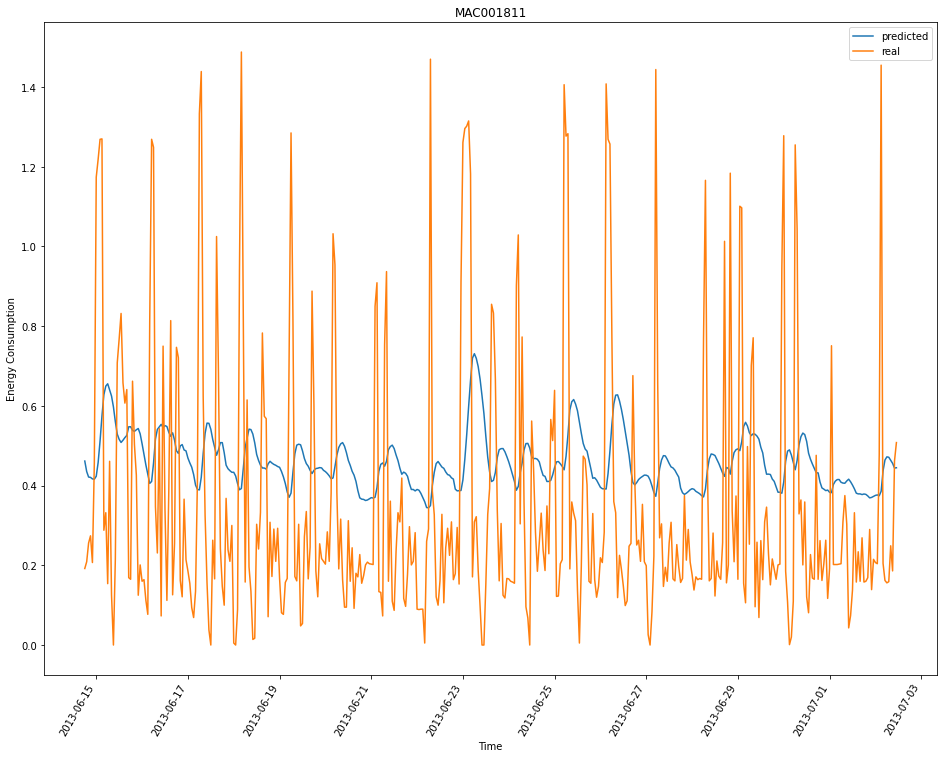

<Figure size 1152x864 with 0 Axes>

In [ ]:
for cl in client_objects:
  if cl.cid == 'MAC001811':
    pred = cl.pred_df
    true = cl.test.iloc[TIME_WINDOW_SIZE:, :]

    x_ax = list(cl.pred_df.index)
    mpl.rcParams['figure.figsize'] = (16, 12)

    plt.plot(x_ax, pred, label='predicted')
    plt.plot(x_ax, true, label='real')
    plt.xticks(rotation=60, ha='right')
    plt.title(cl.cid)
    plt.ylabel("Energy Consumption")
    plt.xlabel("Time")
    plt.legend()
    plt.show()
    plt.savefig('MAC001811.png')
    plt.close()

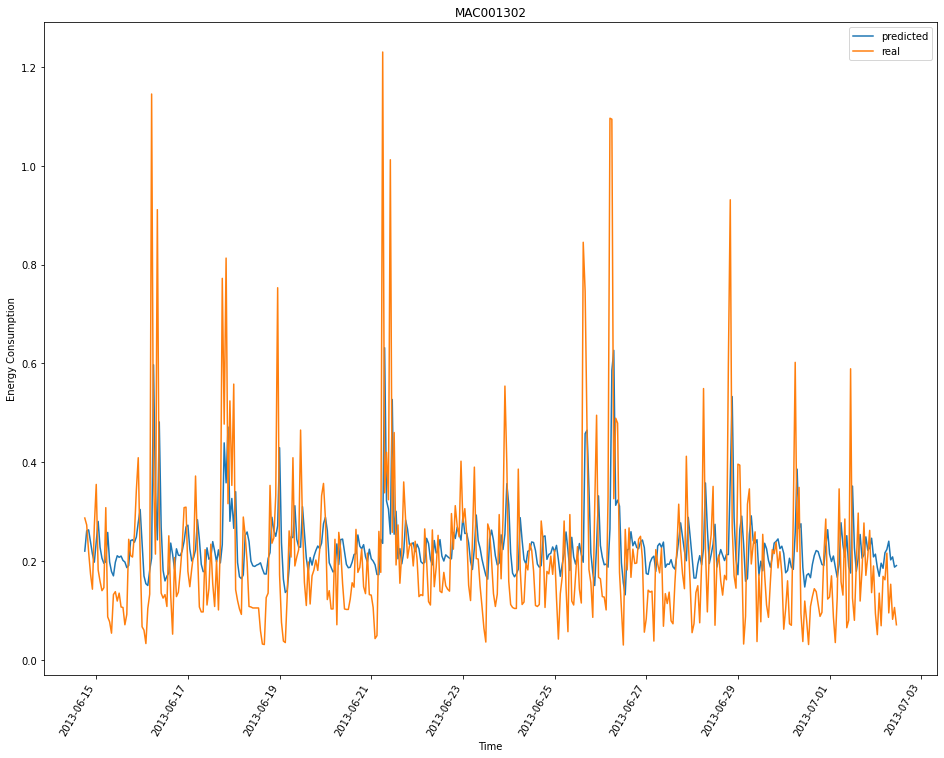

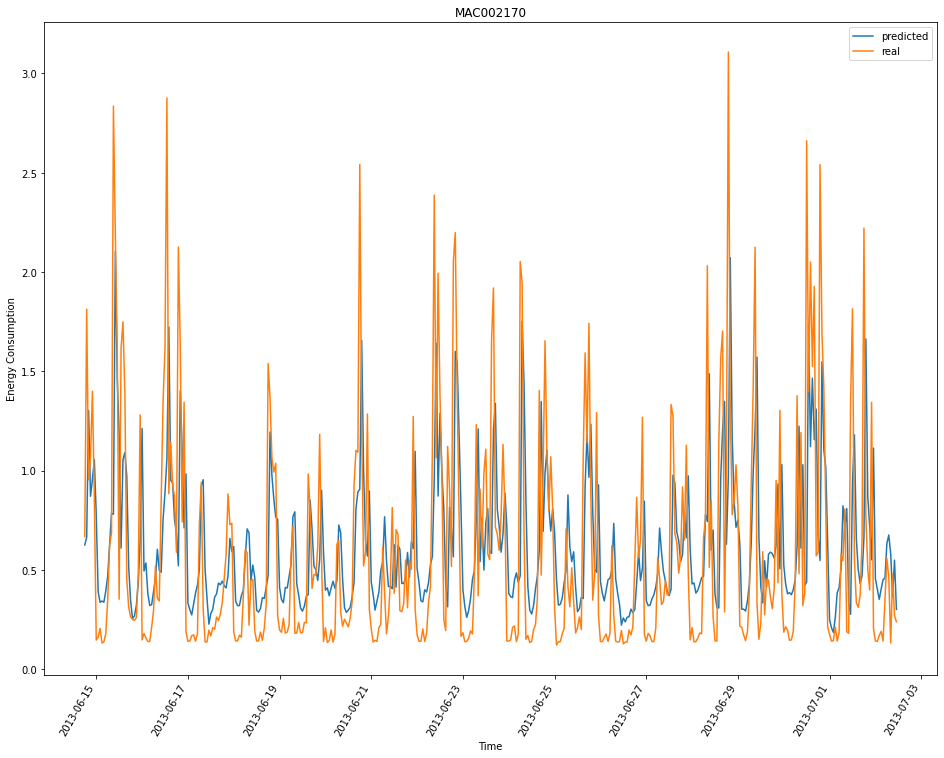

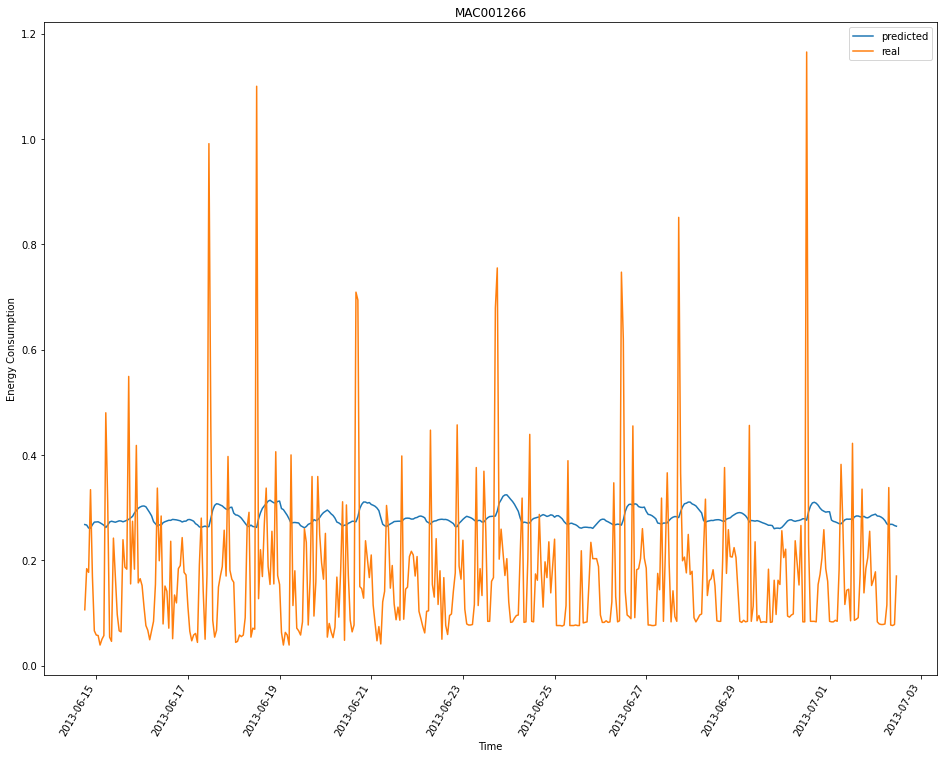

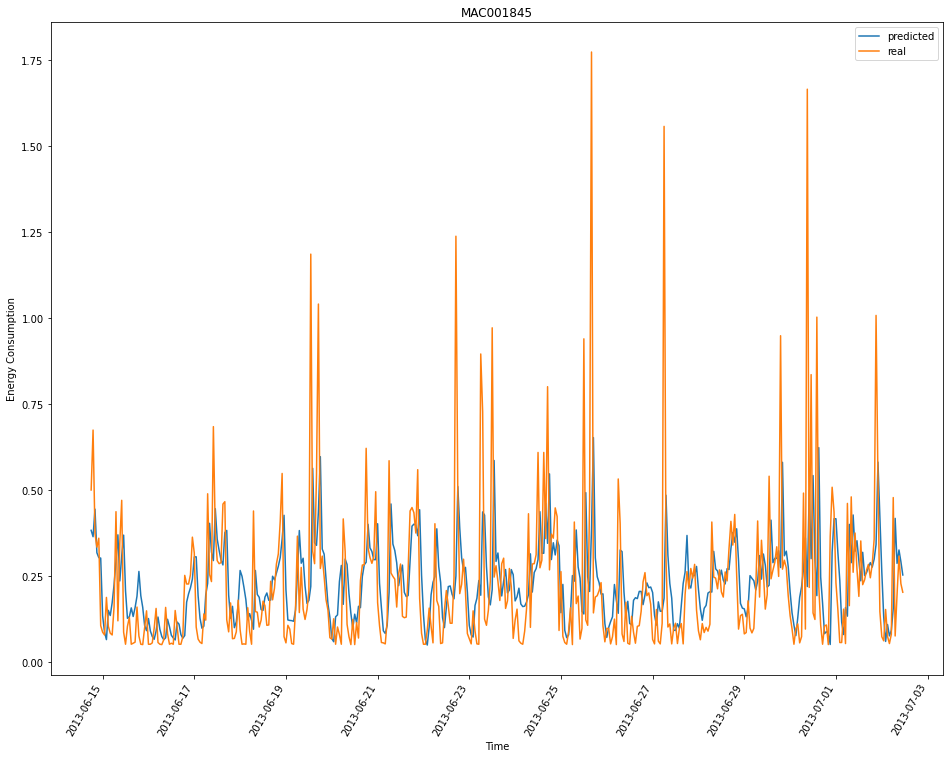

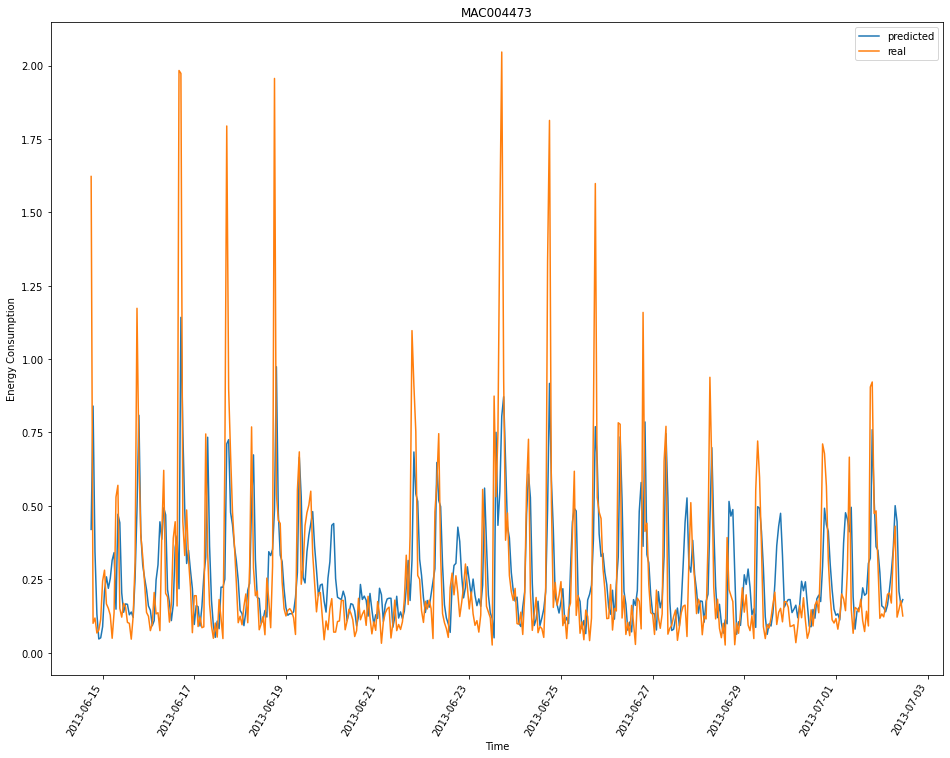

...

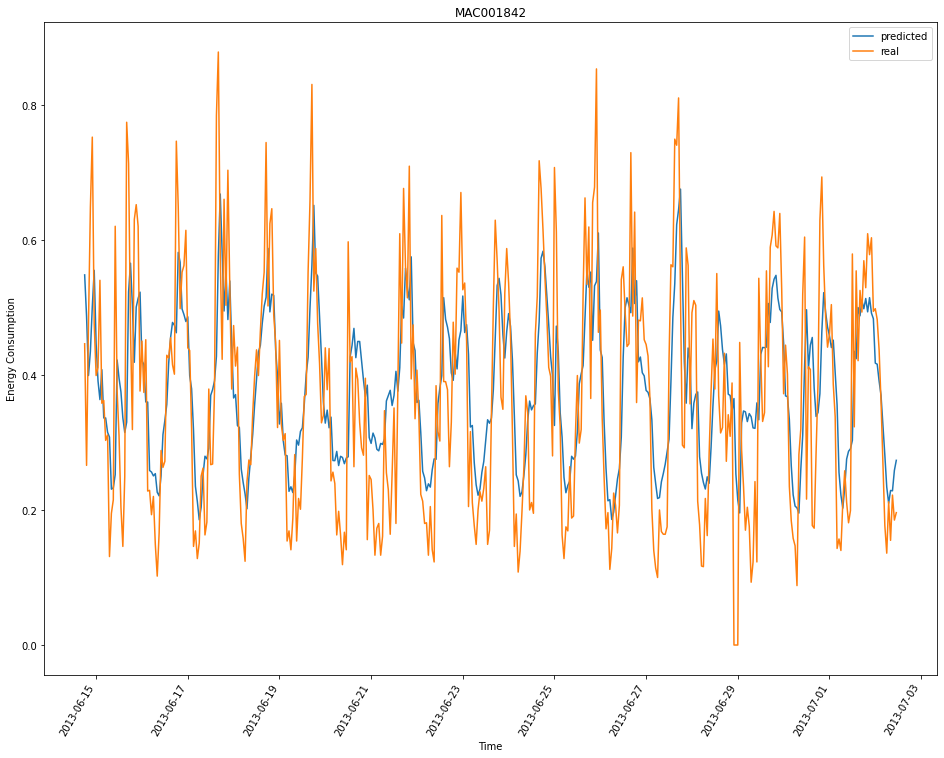

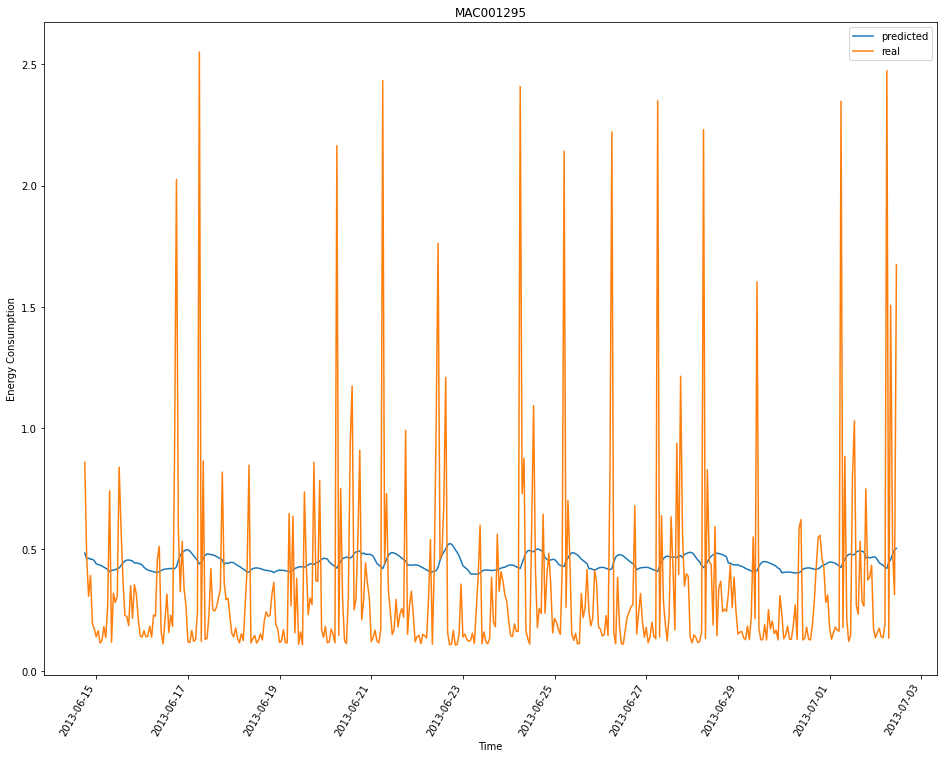

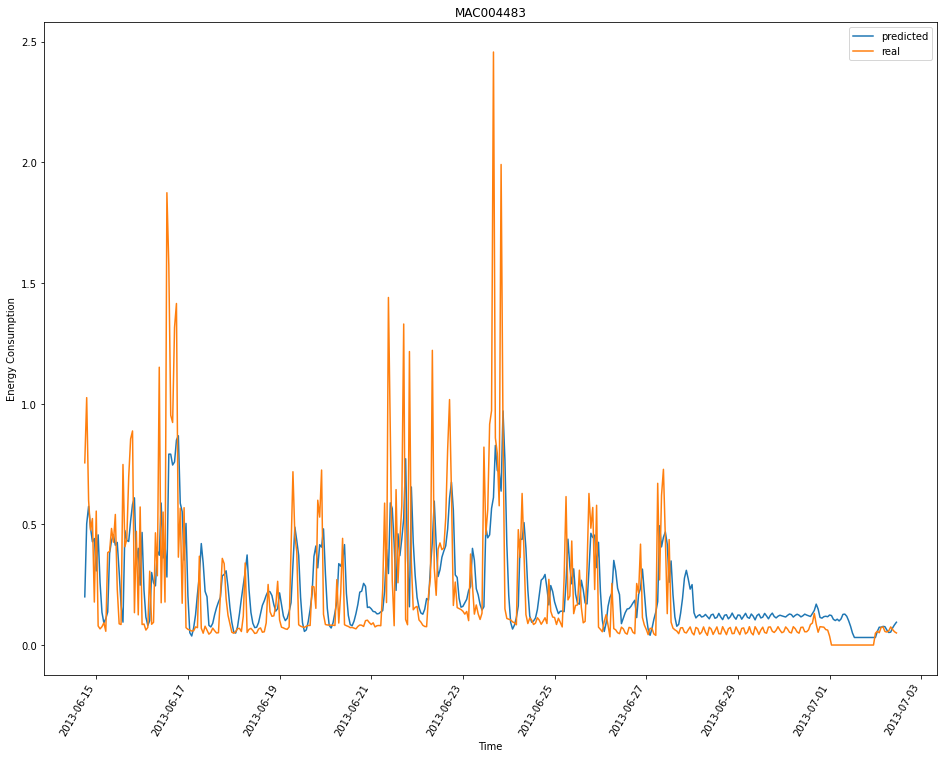

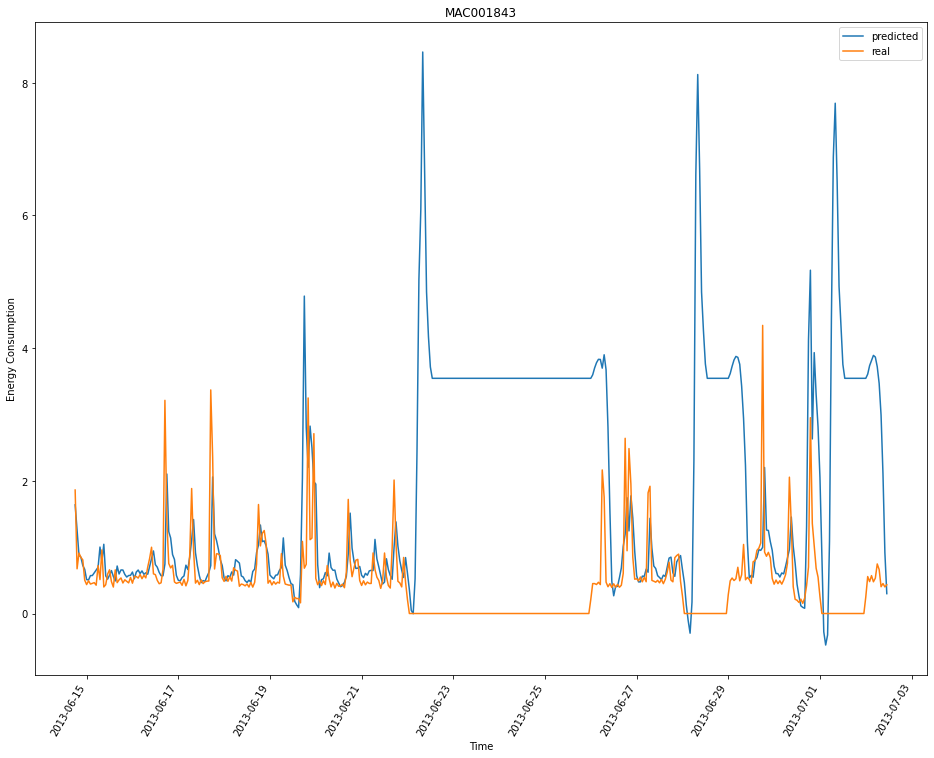

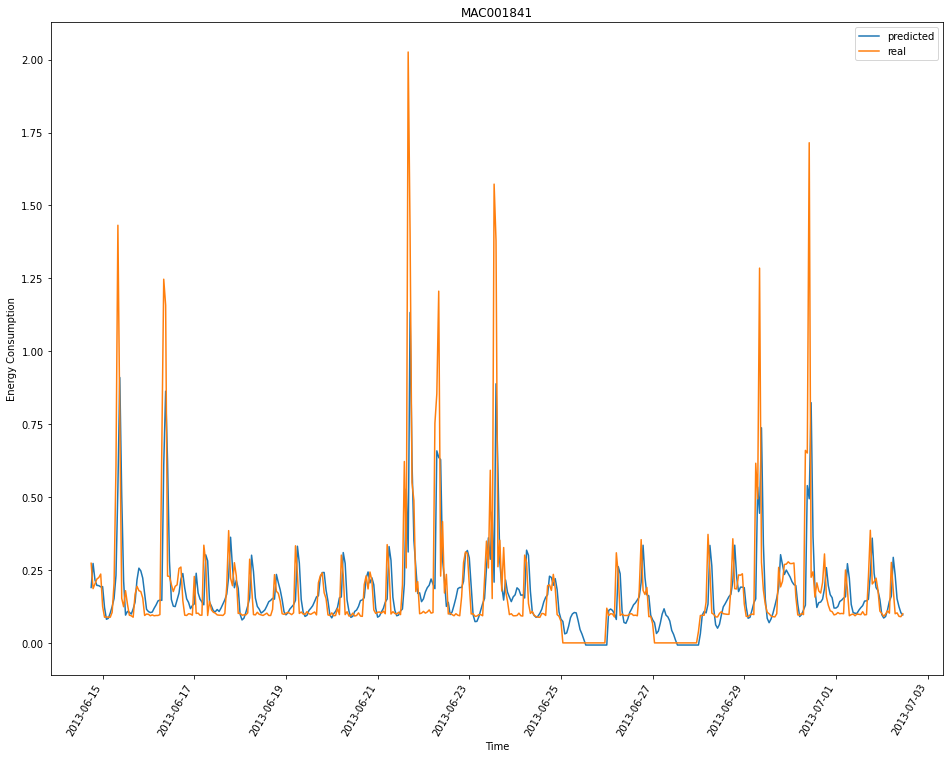

In [ ]:
for cl in client_objects:

  pred = cl.pred_df
  true = cl.test.iloc[TIME_WINDOW_SIZE:, :]

  x_ax = list(cl.pred_df.index)
  mpl.rcParams['figure.figsize'] = (16, 12)

  plt.plot(x_ax, pred, label='predicted')
  plt.plot(x_ax, true, label='real')
  plt.xticks(rotation=60, ha='right')
  plt.title(cl.cid)
  plt.ylabel("Energy Consumption")
  plt.xlabel("Time")
  plt.legend()
  plt.show()
  plt.close()

# Old Trials with BoxCox Transformation

This section is not relevant for the thesis, just contains some old trials where I used BoxCox transformation instead of the simple MinMaxScaler, just to see how the results will differ. Eventually I decided to continue with the MinMaxScaler due to BoxCox not making much of a difference, but I still wanted to keep the old experiments for potential changes in the future.

## BoxCox

In [ ]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox
from pandas.core.common import SettingWithCopyWarning
import warnings

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

In [ ]:
boxcox_df = enriched_data.copy()

for e in boxcox_df:
  e['kWh'] = e['kWh'].replace(0, 0.01)

In [ ]:
for e in boxcox_df:
  print(e['kWh'].min())

0.114
0.052
0.022
0.128
0.01
0.01
0.01
0.001


In [ ]:
client_dict = {}

for k, df in zip(sadi_key_list, boxcox_df):
  client_dict[k] = df

In [ ]:
client_objects = instantiate_clients(client_dict)

for cl in client_objects:
  cl.train_test_val_split()
  #cl.normalize_fn()
  cl.boxcox_fn()
  cl.create_tensor_datasets()
  cl.create_model()
  cl.train_fn()
  cl.evaluate()

## Results & Visualization with BoxCox

In [ ]:
mses = []
r2s = []
houses = []
for cl in client_objects:
  mses.append(cl.test_metrics)
  r2s.append(cl.r2)
  houses.append(cl.cid)

results_df = pd.DataFrame()
results_df['house'] = houses
results_df['mse'] = mses
results_df['r2'] = r2s

results_df

,house,mse,r2
0,MAC002170,0.25411,0.19983
1,MAC001845,0.04497,0.08717
2,MAC001356,0.00969,0.13298
3,MAC001818,0.12852,0.40221
4,MAC002197,0.24940,0.03528
5,MAC002189,0.05435,-0.09808
6,MAC002165,0.20104,0.42762
7,MAC001362,0.01985,-0.25510


In [ ]:
print(np.mean(r2s))
print(np.mean(mses))

0.11648875000000002
0.120241255


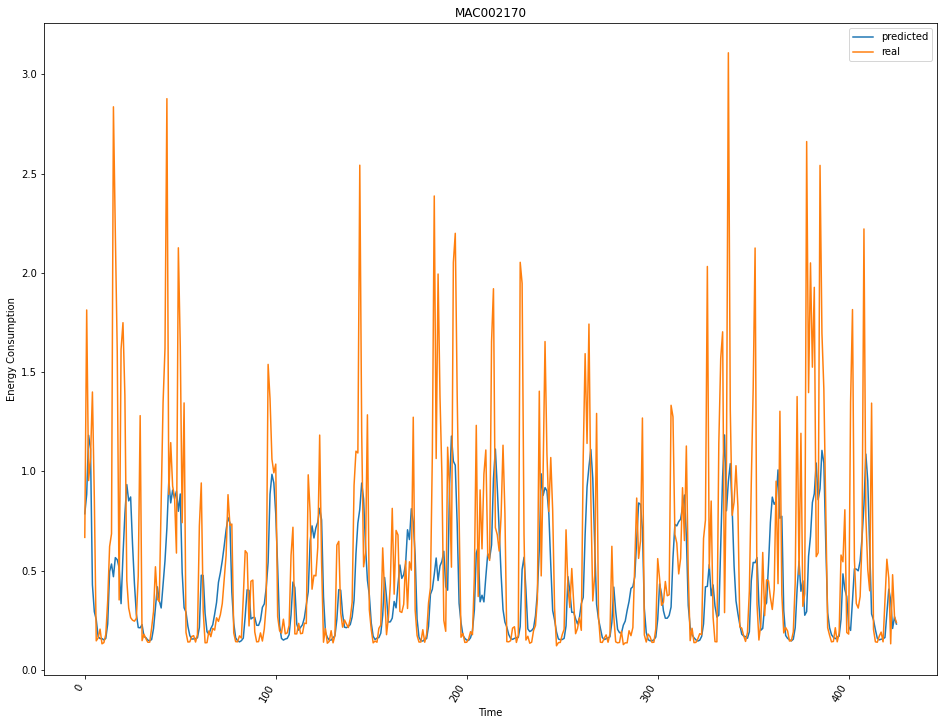

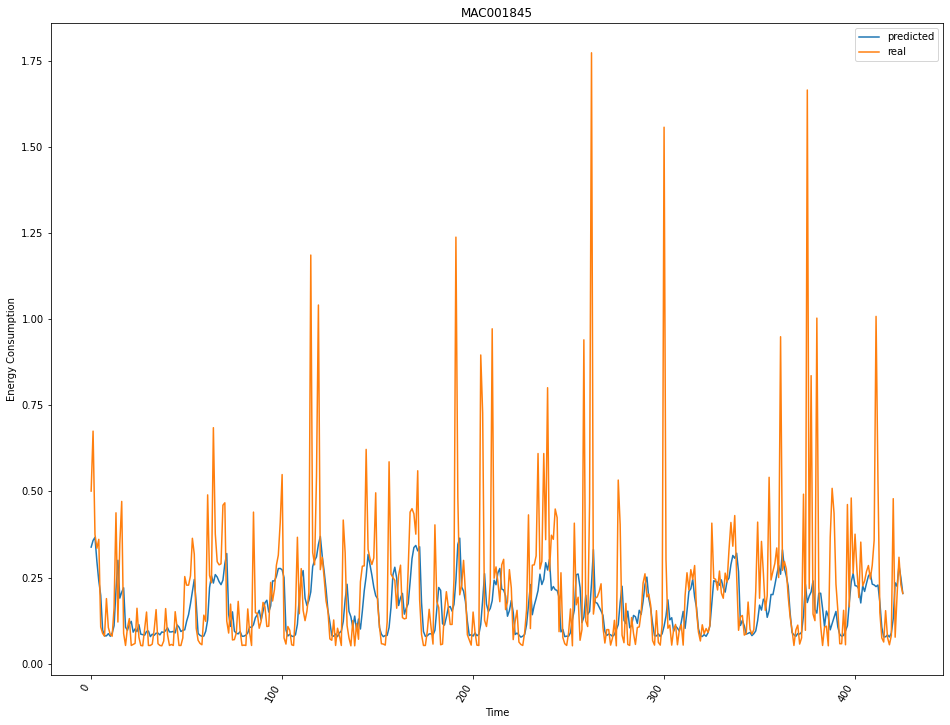

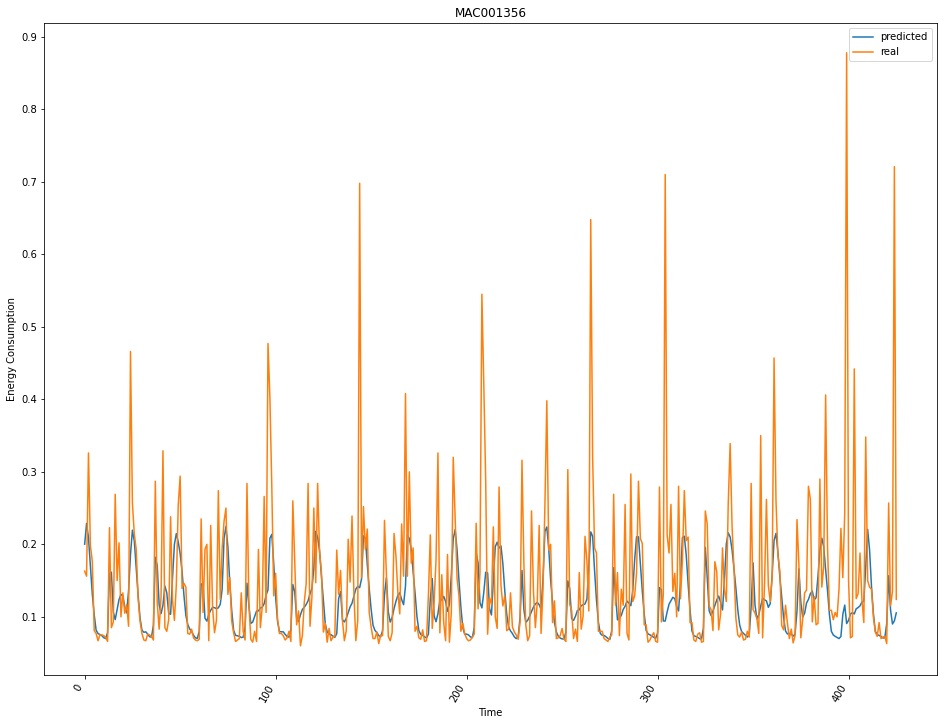

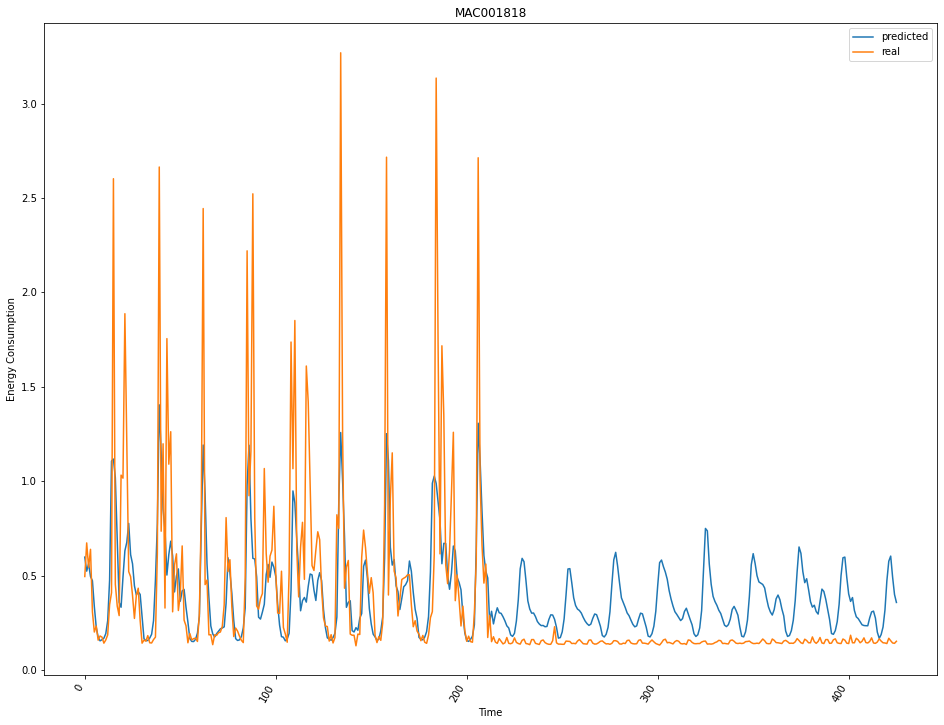

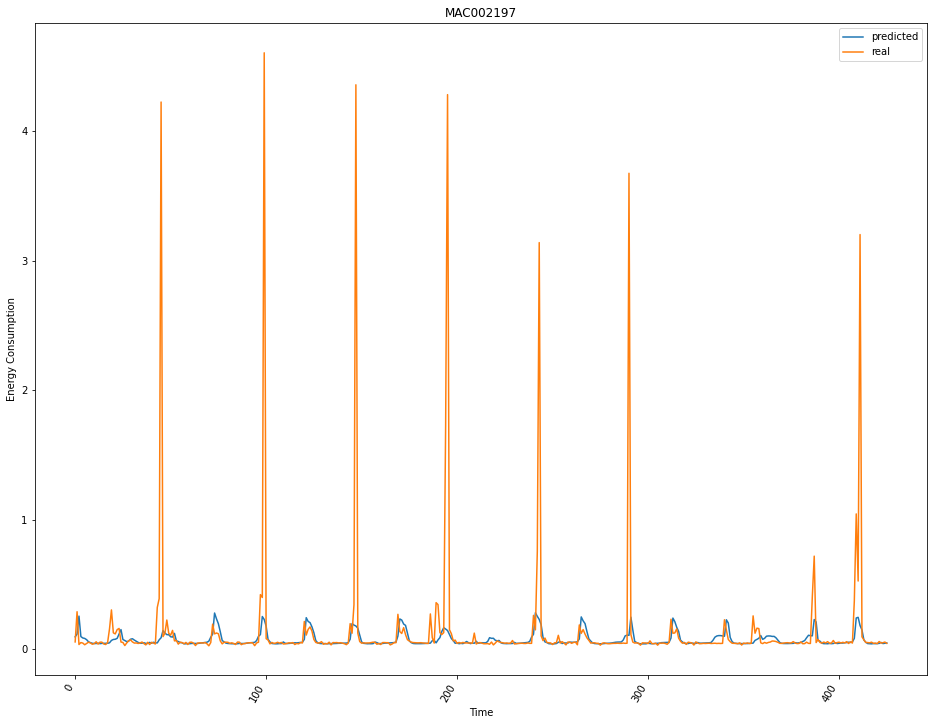

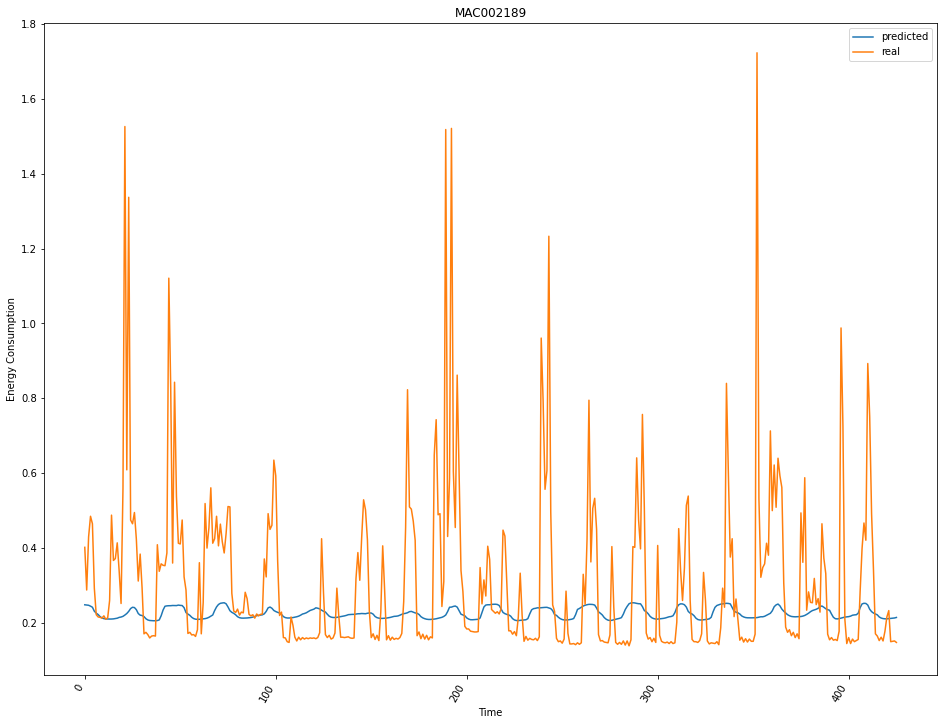

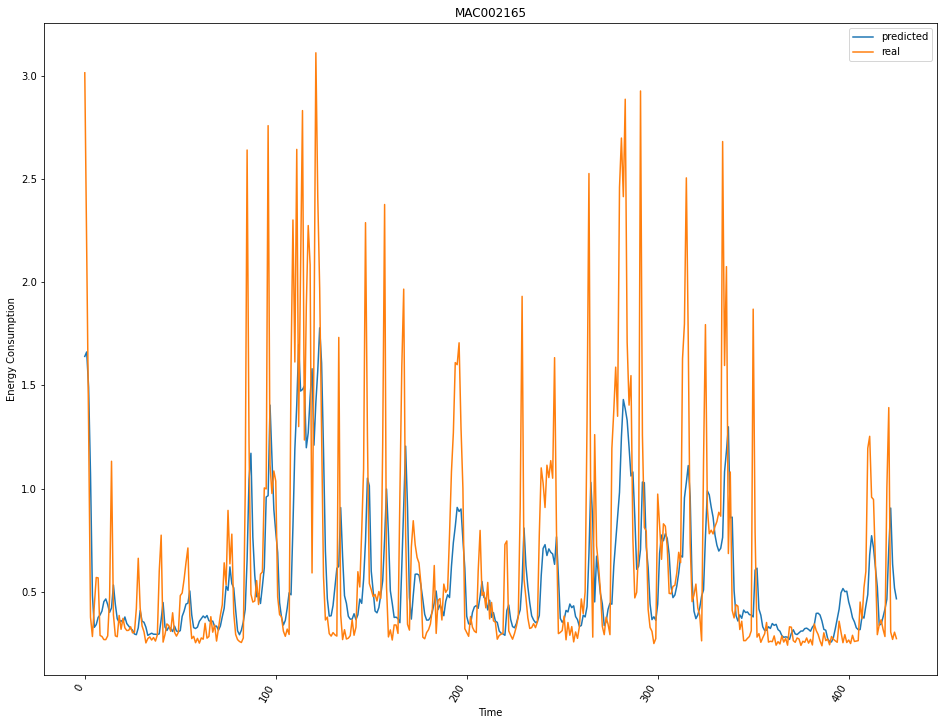

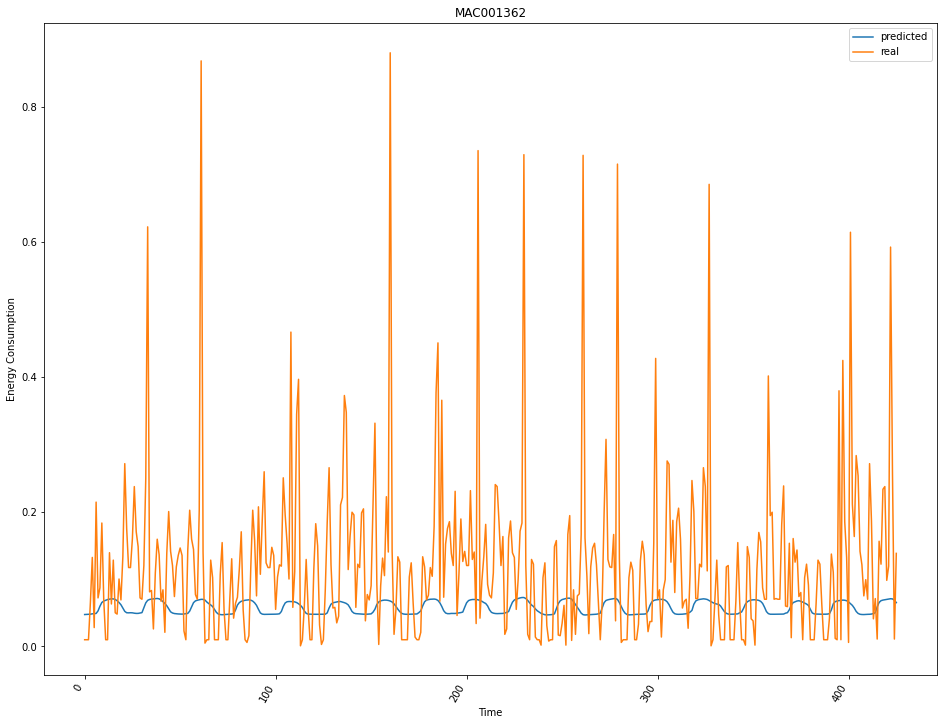

In [ ]:
for cl in client_objects:

  pred = cl.pred_df.iloc[:, 0]
  true = cl.test.iloc[TIME_WINDOW_SIZE:, 0]

  x_ax = list(cl.pred_df.index)
  mpl.rcParams['figure.figsize'] = (16, 12)

  plt.plot(x_ax, pred, label='predicted')
  plt.plot(x_ax, true, label='real')
  plt.xticks(rotation=60, ha='right')
  plt.title(cl.cid)
  plt.ylabel("Energy Consumption")
  plt.xlabel("Time")
  plt.legend()
  plt.show()

## BoxCox Miscellenous

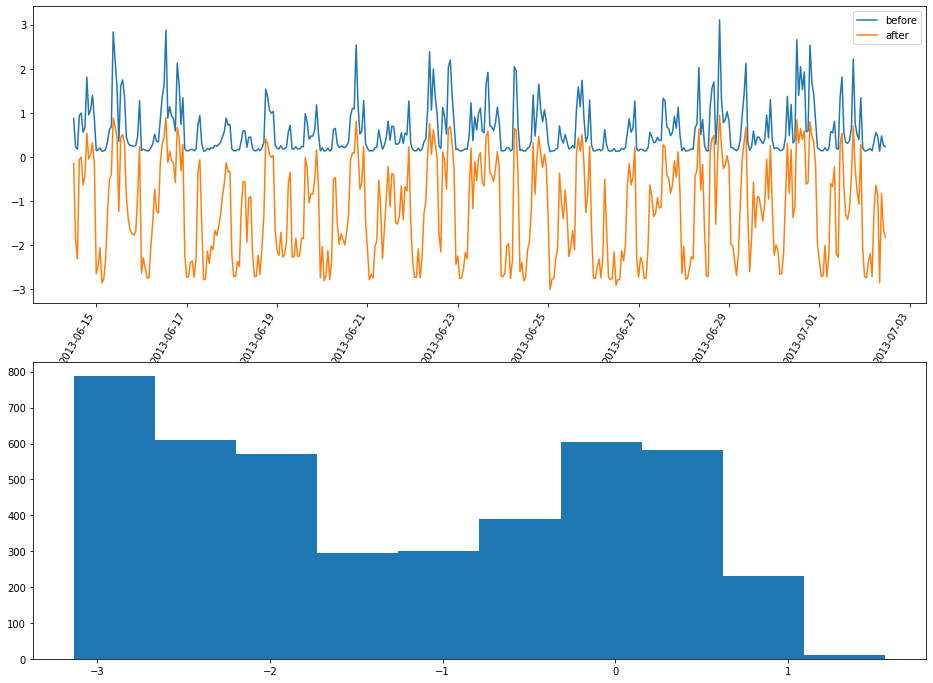

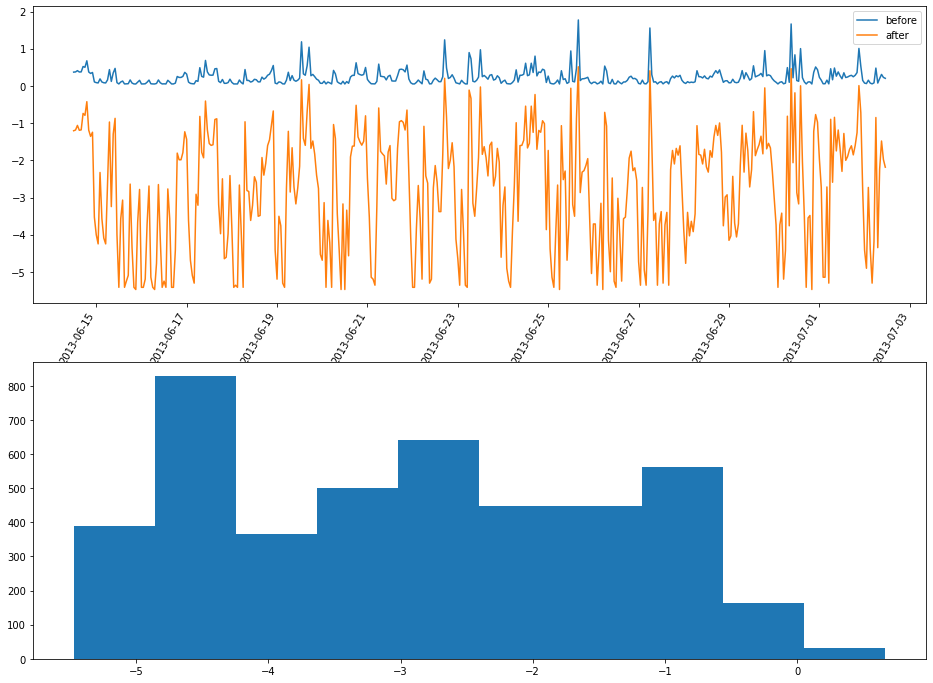

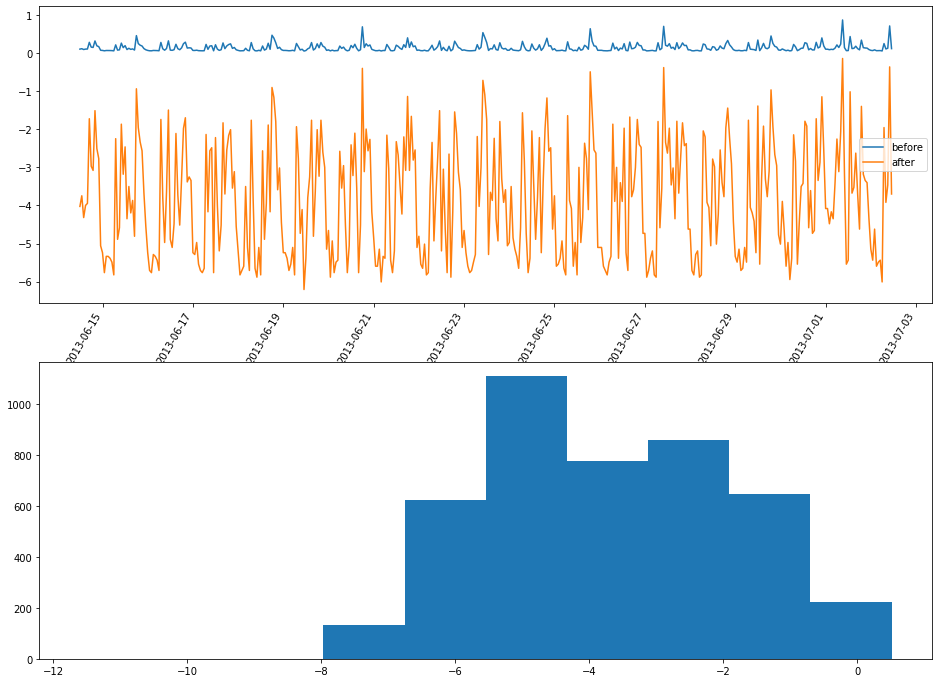

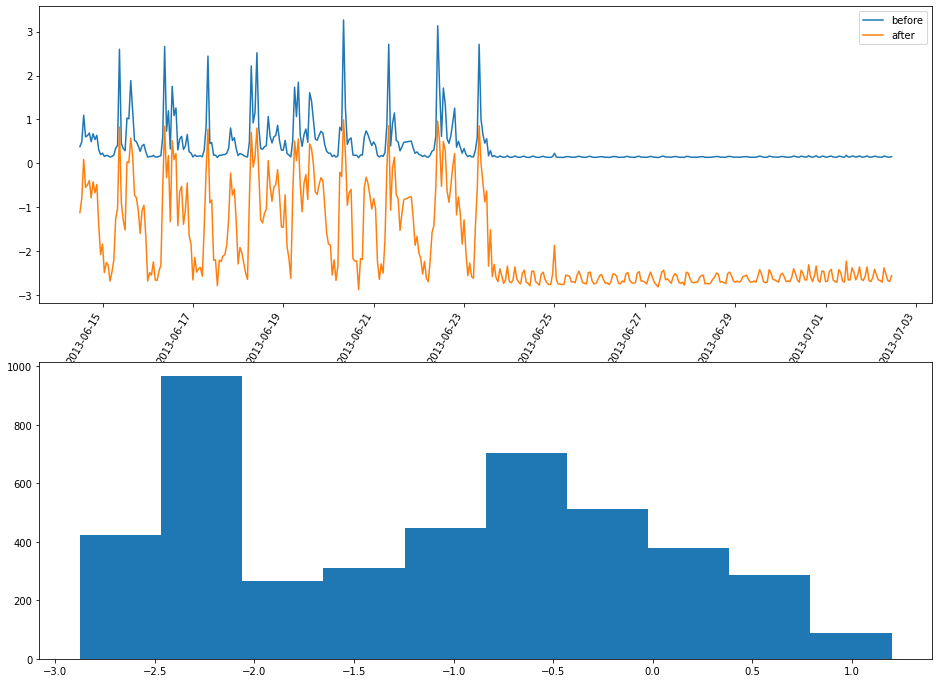

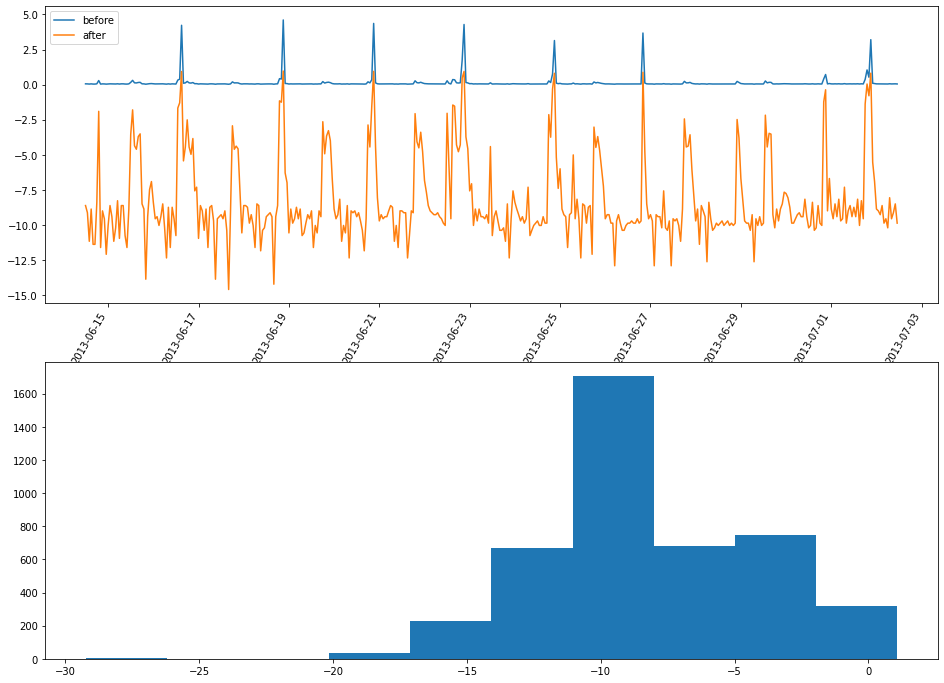

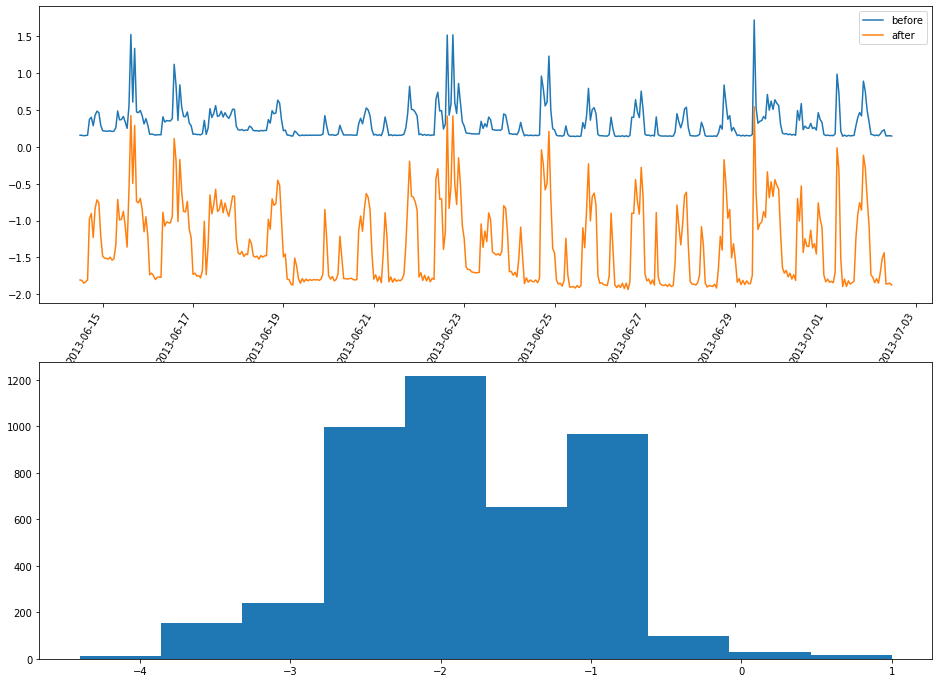

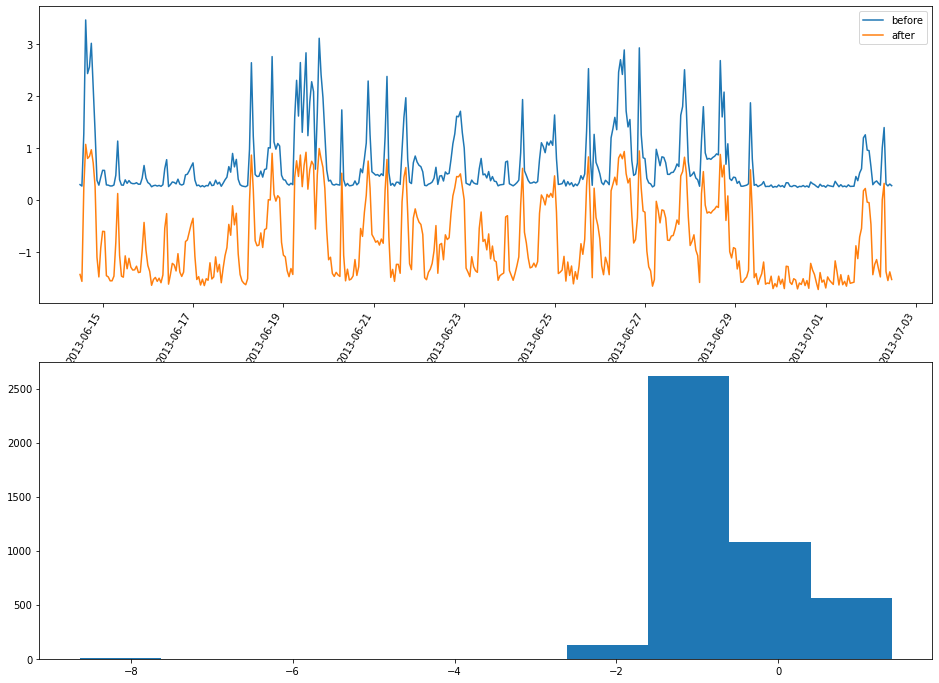

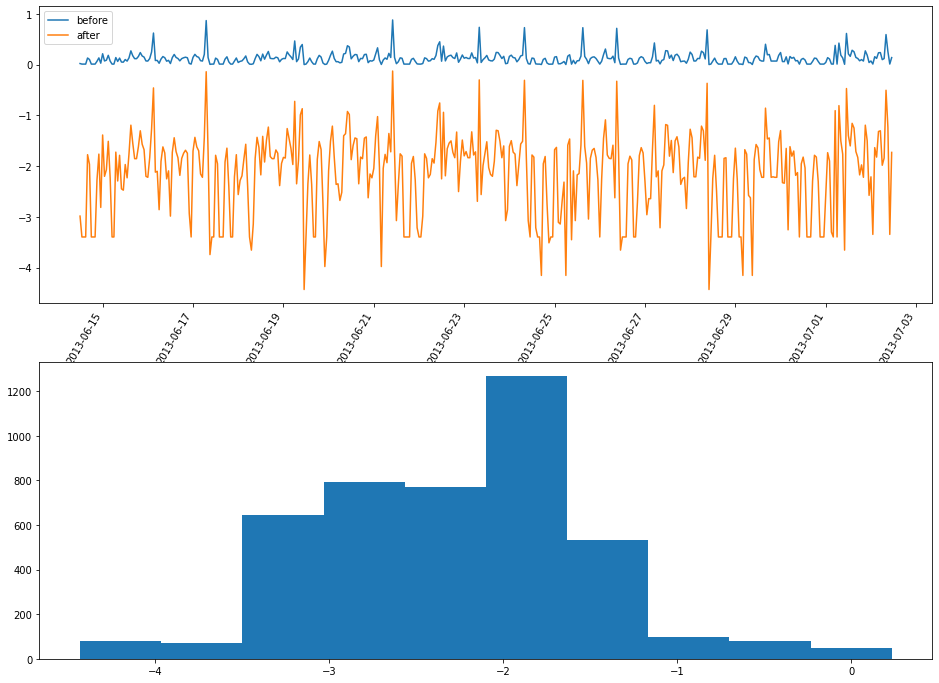

In [ ]:
for e in enriched_data:
  temporary = e.copy()
  temporary['kWh'] = temporary['kWh'].replace(0, 0.01)
  temporary['kWh_boxcox'], lam = boxcox(temporary['kWh'])
  plt.figure(1)

  # line plot
  plt.subplot(211)
  x_ax = list(temporary['kWh'][-432:].index)
  plt.plot(x_ax, temporary['kWh'][-432:], label='before')
  plt.plot(x_ax, temporary['kWh_boxcox'][-432:], label='after')
  plt.legend()
  plt.xticks(rotation=60, ha='right')

  # histogram
  plt.subplot(212)
  plt.hist(temporary['kWh_boxcox'])

  plt.show()

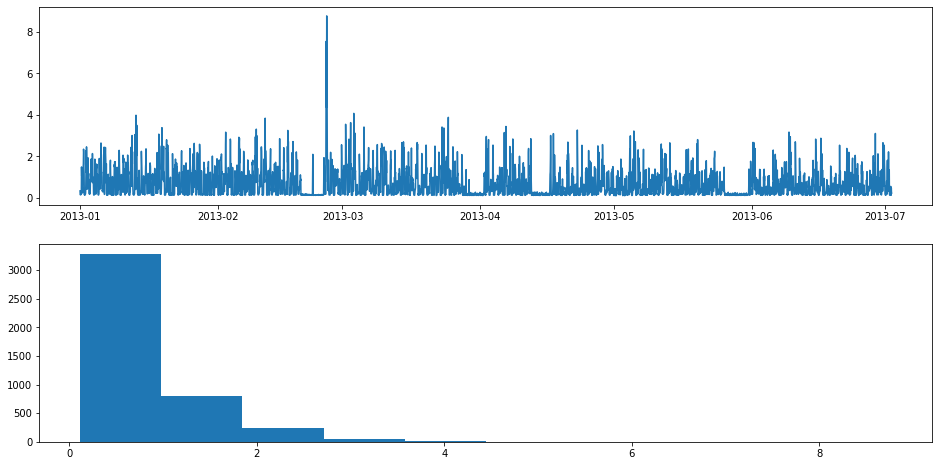

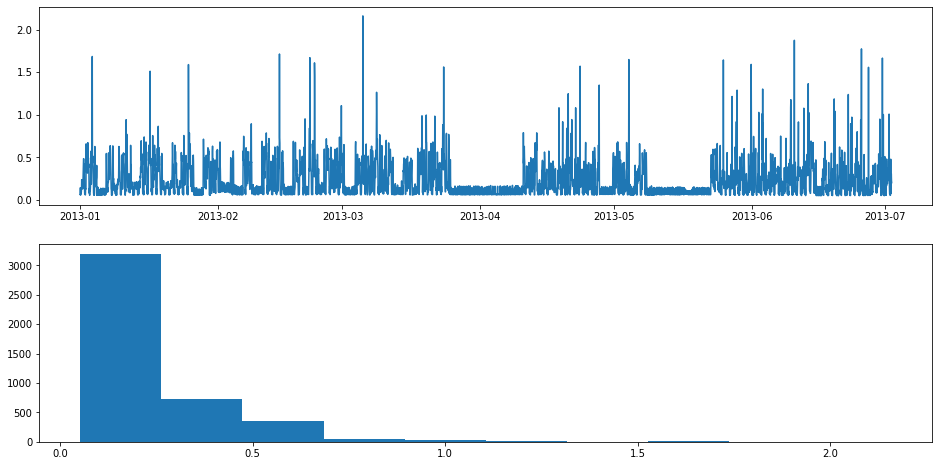

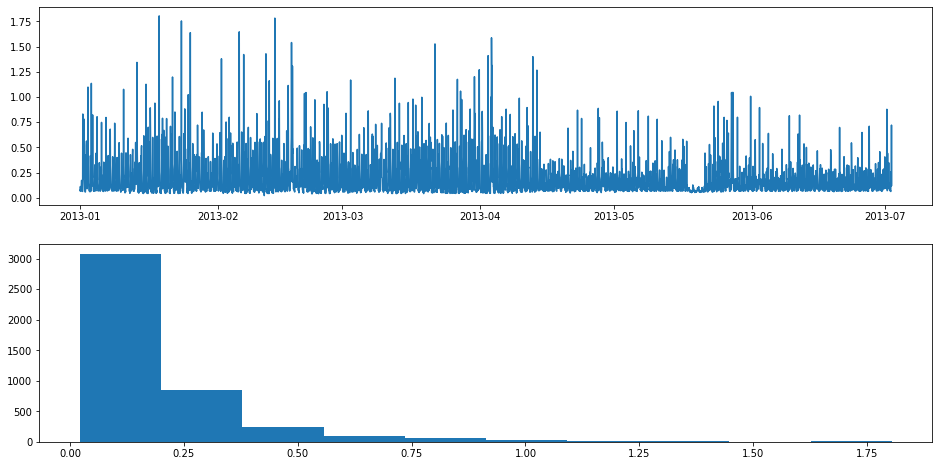

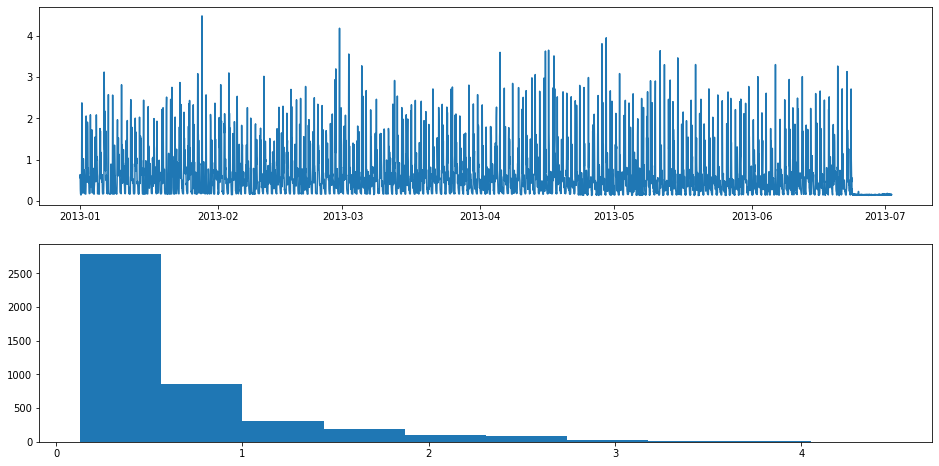

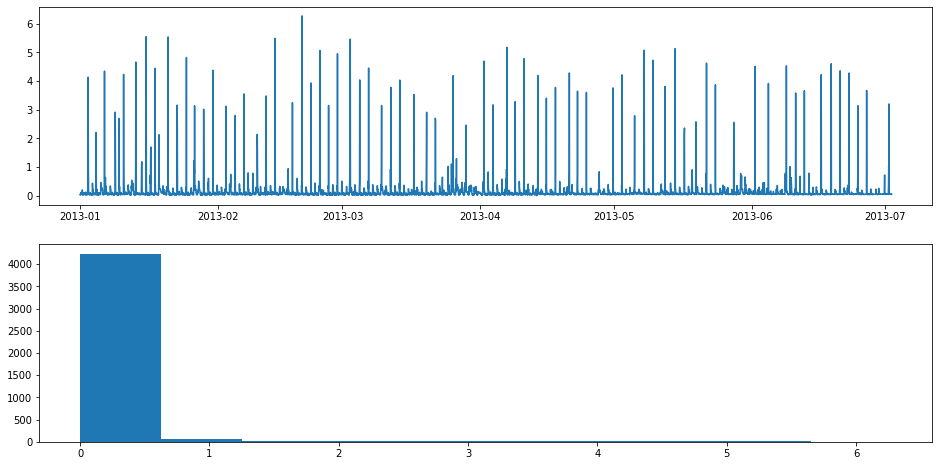

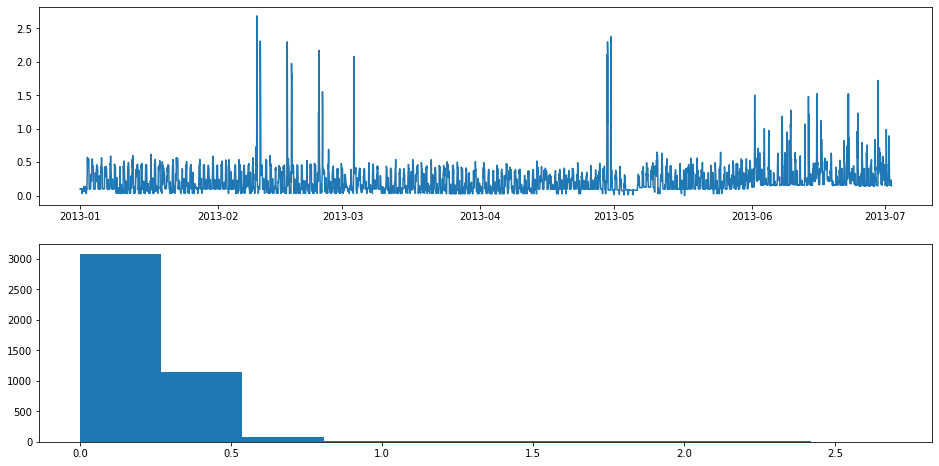

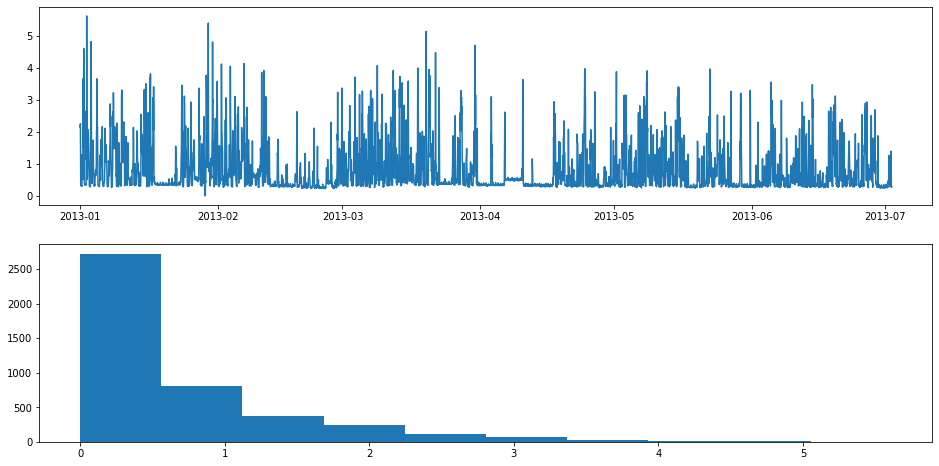

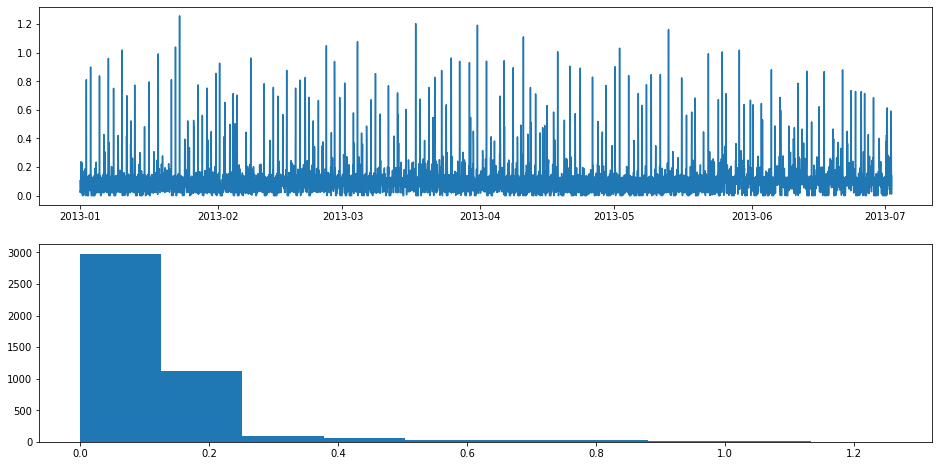

In [ ]:
for e in enriched_data:
  temporary = e.copy()
  plt.figure(1)
  # line plot
  plt.subplot(211)
  plt.plot(temporary['kWh'])
  # histogram
  plt.subplot(212)
  plt.hist(temporary['kWh'])
  plt.show()

Lambda: -0.310343


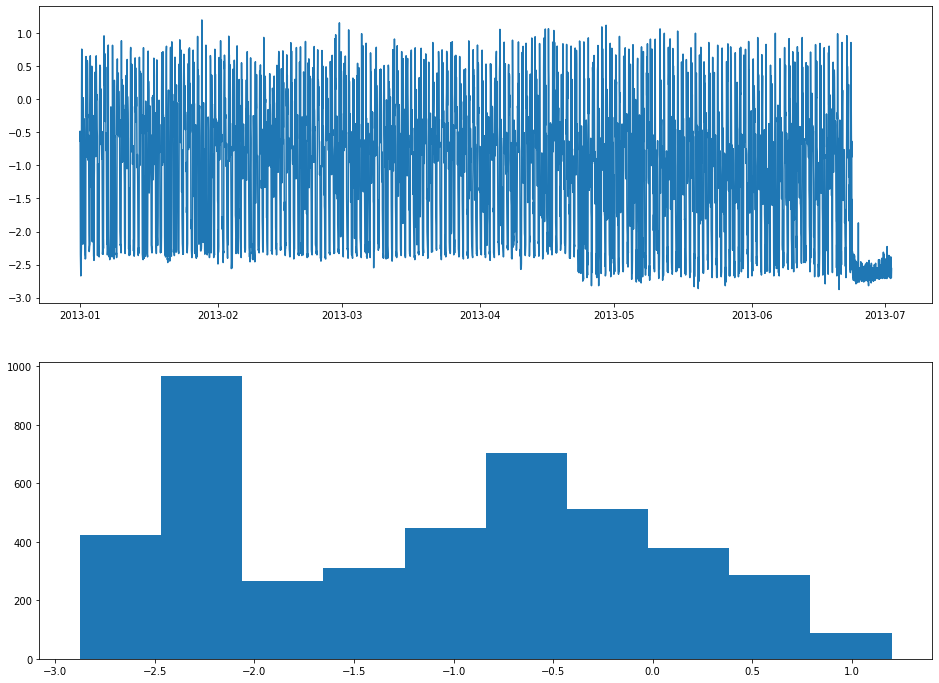

In [ ]:
temporary['kWh_boxcox'], lam = boxcox(temporary['kWh'])
print('Lambda: %f' % lam)
plt.figure(1)
# line plot
plt.subplot(211)
plt.plot(temporary['kWh'])
# histogram
plt.subplot(212)
plt.hist(temporary['kWh'])
plt.show()

In [ ]:
server = Server(number_of_training_rounds = 20)

In [ ]:
server.federated_training(client_objects_short)

--------------------------------------------------
Round 0 is starting...
Epoch 1/10
6/6 [==============================] - 10s 246ms/step - loss: 0.0134 - mse: 0.0134 - val_loss: 0.0049 - val_mse: 0.0049
Epoch 2/10
6/6 [==============================] - 1s 166ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0051 - val_mse: 0.0051
Epoch 3/10
6/6 [==============================] - 1s 79ms/step - loss: 0.0069 - mse: 0.0069 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 4/10
6/6 [==============================] - 1s 156ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 5/10
6/6 [==============================] - 1s 92ms/step - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 6/10
6/6 [==============================] - 1s 121ms/step - loss: 0.0072 - mse: 0.0072 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 7/10
6/6 [==============================] - 0s 66ms/step - loss: 0.0070 - mse: 0.0070 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 8/10
6/6 [==